# Trasfer learning: Food Vision (Food101)

In [1]:
!nvidia-smi

/bin/bash: /home/priteshk/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Wed Jan 11 12:03:22 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.65       Driver Version: 527.56       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:01:00.0 Off |                  N/A |
| N/A   60C    P8    11W /  95W |      0MiB /  6144MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+--------------

In [2]:
import tensorflow as tf

2023-01-11 12:03:22.980265: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [3]:
# Import helper functions
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir, compare_historys

## 101 Food Classes: working with less data

In [ ]:
!python -m wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
unzip_data("101_food_classes_10_percent.zip")

In [4]:
train_dir = "101_food_classes_10_percent/train"
test_dir = "101_food_classes_10_percent/test"

In [5]:
# Check directory
walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent/test'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/apple_pie'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/baby_back_ribs'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beef_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beet_salad'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beignets'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/bibimbap'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/bread_pudding'.
There are 0 directories and 250 images in '10

In [6]:
# Setup data inputs
import tensorflow as tf

IMG_SIZE = (224, 224)

train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                               image_size=IMG_SIZE,
                                                                               label_mode="categorical")

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                               image_size=IMG_SIZE,
                                                               label_mode="categorical",
                                                               shuffle=False)

Found 7575 files belonging to 101 classes.


2023-01-11 12:03:34.642790: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-01-11 12:03:34.667971: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-01-11 12:03:34.668019: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-01-11 12:03:34.668494: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow 

Found 25250 files belonging to 101 classes.


## Train a big model with transfer learning on 10% of 101 food classes

Steps:
* Create a ModelCheckpoint callback
* Create a data augmentation layer
* Build a headless (no top layers) Functional EfficientNetB0 backboned-model
* Compile our model
* Feature extract for full passes

In [7]:
# Creat checkpoint callback
checkpoint_path = "101_classes_10_percent_data_model_checkpoint/checkpoints.ckpt"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                        save_weights_only=True,
                                                        monitor="val_accuracy",
                                                        save_best_only=True)

In [8]:
# Create data augmentation layer
from tensorflow.keras import layers
from tensorflow.keras import Sequential

data_augmentation = Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    # layers.Rescaling(1/255.) # Rescale images required for ResNet50v2
], name="data_augmentation")

In [9]:
# Setup the base mode and freeze its layers (to extract features)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layres
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs) # Augment images during training
x = base_model(x, training=False) # put base model in inference mode to set weights frozen
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(len(train_data_all_10_percent.class_names), activation="softmax", name="output_layer")(x)

model = tf.keras.Model(inputs, outputs)

In [10]:
# Compile the model
model.compile(loss="categorical_crossentropy",
             optimizer=tf.keras.optimizers.Adam(),
             metrics=["accuracy"])

In [11]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [12]:
# Fit the model
base_model_history_101_food_classes_10_percent = model.fit(train_data_all_10_percent,
                                                          epochs=5,
                                                          validation_data=test_data,
                                                          validation_steps=int(0.15*len(test_data)),
                                                          callbacks=[checkpoint_callback, create_tensorboard_callback(dir_name="transfer_learning",
                                                                                                                       experiment_name="base_model_history_101_food_classes_10_percent")])

Saving TensorBoard log files to: transfer_learning/base_model_history_101_food_classes_10_percent/20230111-120403
Epoch 1/5


2023-01-11 12:04:08.314205: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


  1/237 [..............................] - ETA: 28:24 - loss: 4.8329 - accuracy: 0.0000e+00

2023-01-11 12:04:11.071161: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


237/237 [==============================] - 80s 307ms/step - loss: 3.3858 - accuracy: 0.2770 - val_loss: 2.4851 - val_accuracy: 0.4558
Epoch 2/5
237/237 [==============================] - 61s 257ms/step - loss: 2.1925 - accuracy: 0.4999 - val_loss: 2.0277 - val_accuracy: 0.5135
Epoch 3/5
237/237 [==============================] - 60s 254ms/step - loss: 1.8168 - accuracy: 0.5681 - val_loss: 1.8327 - val_accuracy: 0.5358
Epoch 4/5
237/237 [==============================] - 60s 250ms/step - loss: 1.5970 - accuracy: 0.6139 - val_loss: 1.7786 - val_accuracy: 0.5363
Epoch 5/5
237/237 [==============================] - 56s 236ms/step - loss: 1.4513 - accuracy: 0.6437 - val_loss: 1.7811 - val_accuracy: 0.5305


In [13]:
# Evaluate on whole test dataset
feature_extraction_results = model.evaluate(test_data)
feature_extraction_results

790/790 [==============================] - 57s 72ms/step - loss: 1.5854 - accuracy: 0.5815


[1.5854042768478394, 0.5815445780754089]

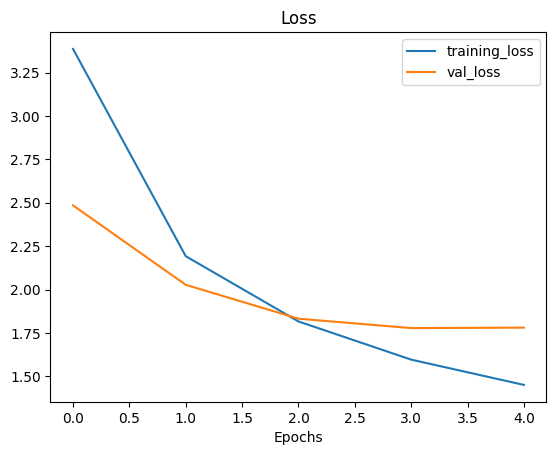

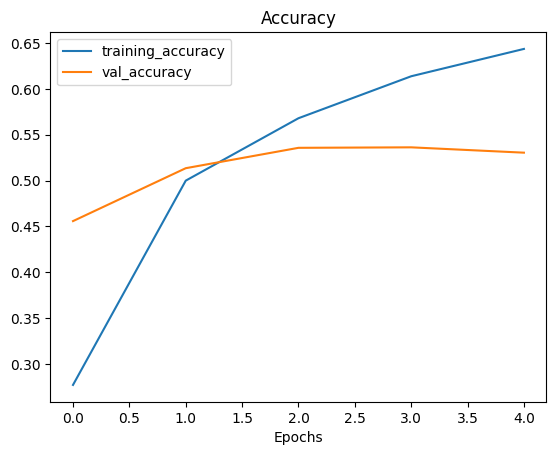

In [14]:
plot_loss_curves(base_model_history_101_food_classes_10_percent)

## Fine tuning

In [15]:
# unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except last 5
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [16]:
for i, layer in enumerate(base_model.layers[-10:]):
    print(i, layer.name, layer.trainable)
    

0 block7a_se_squeeze False
1 block7a_se_reshape False
2 block7a_se_reduce False
3 block7a_se_expand False
4 block7a_se_excite False
5 block7a_project_conv True
6 block7a_project_bn True
7 top_conv True
8 top_bn True
9 top_activation True


In [17]:
# Recompiling model with lower learning_rate
model.compile(loss="categorical_crossentropy",
             optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
             metrics=["accuracy"])

In [18]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 910,821
Non-trainab

In [19]:
# Fit the model again
initial_epochs = 5
history_fine_tuned_base_model_101_food_classes_10_percent = model.fit(train_data_all_10_percent,
                                                                     epochs=initial_epochs + 5,
                                                                     validation_data=test_data,
                                                                     validation_steps=int(0.15 * len(test_data)),
                                                                     initial_epoch=base_model_history_101_food_classes_10_percent.epoch[-1],
                                                                     callbacks=[create_tensorboard_callback(dir_name="transfer_learning",
                                                                                                           experiment_name="history_fine_tuned_base_model_101_food_classes_10_percent")])

Saving TensorBoard log files to: transfer_learning_scaling_up/history_fine_tuned_base_model_101_food_classes_10_percent/20230111-121018
Epoch 5/10
237/237 [==============================] - 62s 235ms/step - loss: 1.2108 - accuracy: 0.6830 - val_loss: 1.7152 - val_accuracy: 0.5463
Epoch 6/10
237/237 [==============================] - 53s 223ms/step - loss: 1.0902 - accuracy: 0.7044 - val_loss: 1.7452 - val_accuracy: 0.5442
Epoch 7/10
237/237 [==============================] - 52s 218ms/step - loss: 1.0178 - accuracy: 0.7303 - val_loss: 1.7298 - val_accuracy: 0.5416
Epoch 8/10
237/237 [==============================] - 52s 219ms/step - loss: 0.9427 - accuracy: 0.7455 - val_loss: 1.7247 - val_accuracy: 0.5424
Epoch 9/10
237/237 [==============================] - 51s 214ms/step - loss: 0.8850 - accuracy: 0.7620 - val_loss: 1.6869 - val_accuracy: 0.5564
Epoch 10/10
237/237 [==============================] - 49s 207ms/step - loss: 0.8314 - accuracy: 0.7744 - val_loss: 1.7279 - val_accuracy: 

In [20]:
# Evaluate on whole dataset
all_classes_10_percent_fine_tune_results = model.evaluate(test_data)
all_classes_10_percent_fine_tune_results

790/790 [==============================] - 62s 78ms/step - loss: 1.5027 - accuracy: 0.6032


[1.5027210712432861, 0.6032079458236694]

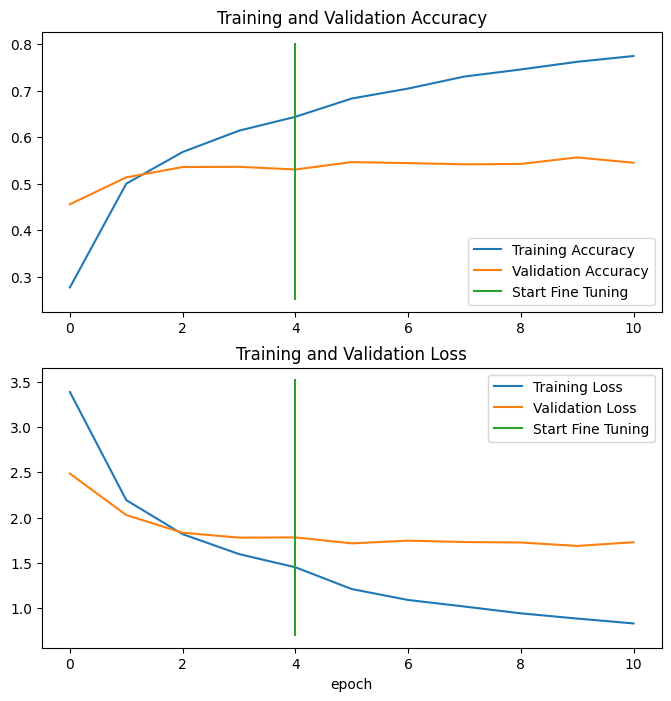

In [21]:
# Compare the histories with fine tuning
compare_historys(original_history=base_model_history_101_food_classes_10_percent,
                new_history=history_fine_tuned_base_model_101_food_classes_10_percent,
                initial_epochs=5)

## Saving and loading our model

to use it in extrenal applications

In [22]:
# Save our model in h5 format
model.save("FastAPI_app/model/fine_tuned_model_v1.h5")

In [23]:
# Load and evaluate saved model
loaded_model = tf.keras.models.load_model("FastAPI_app/model/fine_tuned_model_v1.h5")

In [24]:
# Evaluate loaded models
loaded_model_results = loaded_model.evaluate(test_data)
loaded_model_results

790/790 [==============================] - 63s 78ms/step - loss: 1.5027 - accuracy: 0.6032


[1.5027238130569458, 0.6032475233078003]

In [25]:
# Model results before loading
all_classes_10_percent_fine_tune_results

[1.5027210712432861, 0.6032079458236694]

## Making perdictions with our trained model

In [26]:
# Make predictions with model
preds_probs =  loaded_model.predict(test_data, verbose=1) # set verbosity to see how log is left

790/790 [==============================] - 66s 81ms/step


In [27]:
# How many predictions are there
len(preds_probs)

25250

In [28]:
# Shapes of out predictions
preds_probs.shape

(25250, 101)

In [29]:
# let's see what first 10 predictions look like
preds_probs[:10]

array([[4.6412885e-01, 1.2369723e-03, 5.9786767e-02, ..., 4.0918367e-06,
        4.4599921e-03, 6.2684584e-03],
       [9.5107746e-01, 1.0225453e-07, 1.9213455e-03, ..., 5.4600965e-03,
        1.7172100e-07, 7.8269713e-06],
       [5.0995350e-01, 2.6193976e-02, 3.0247578e-02, ..., 4.4330783e-04,
        3.7363847e-04, 2.1178783e-03],
       ...,
       [1.5178029e-01, 1.0722618e-05, 4.9031555e-04, ..., 6.8940029e-02,
        5.9747958e-04, 7.9697071e-05],
       [1.4388290e-01, 9.3740353e-04, 2.2539556e-01, ..., 3.6238888e-04,
        1.2222526e-04, 1.4591930e-04],
       [7.6412648e-01, 1.0322028e-06, 2.3815909e-03, ..., 5.4645184e-03,
        5.8650937e-07, 2.8470752e-04]], dtype=float32)

In [30]:
preds_probs[0], max(preds_probs[0]), sum(preds_probs[0])

(array([4.6412885e-01, 1.2369723e-03, 5.9786767e-02, 2.0756943e-07,
        5.8048554e-06, 3.3395318e-06, 1.0717391e-04, 1.9827251e-06,
        1.9121001e-02, 2.2778963e-04, 1.2534358e-06, 4.4230724e-06,
        3.5941039e-04, 2.6386584e-07, 5.1212390e-03, 3.9491071e-03,
        3.0231520e-05, 9.4381970e-04, 3.8363109e-03, 1.7795803e-05,
        9.9693984e-04, 1.4473599e-05, 1.0889259e-04, 9.4972202e-05,
        1.3363729e-03, 8.4659588e-03, 6.1876903e-04, 1.9174988e-05,
        9.7189642e-02, 7.2978239e-04, 3.8195581e-06, 1.3267245e-03,
        9.8253635e-04, 1.4341761e-07, 1.9850088e-03, 8.8716928e-07,
        8.0413134e-05, 1.1096199e-03, 2.2594586e-02, 6.0369843e-05,
        9.3578565e-04, 1.0774392e-03, 3.6533218e-04, 4.9346609e-06,
        1.1730274e-04, 2.8261389e-05, 7.9428713e-04, 6.5486616e-05,
        9.5800817e-07, 7.5730465e-02, 2.5866381e-04, 6.5407097e-05,
        8.3471231e-02, 3.9104145e-02, 4.4199523e-06, 1.0174878e-02,
        1.2313881e-02, 2.1180203e-03, 1.7600801e

In [31]:
# we get one prediction probability per class
print(f"Number of prediction probabilities for sample 0: {len(preds_probs[0])}")
print(f"Waht prediction probability sample 0 looks like:\n {preds_probs[0]}")
print(f"The class with the heighest predicted probability by the model for sample 0: {preds_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
Waht prediction probability sample 0 looks like:
 [4.6412885e-01 1.2369723e-03 5.9786767e-02 2.0756943e-07 5.8048554e-06
 3.3395318e-06 1.0717391e-04 1.9827251e-06 1.9121001e-02 2.2778963e-04
 1.2534358e-06 4.4230724e-06 3.5941039e-04 2.6386584e-07 5.1212390e-03
 3.9491071e-03 3.0231520e-05 9.4381970e-04 3.8363109e-03 1.7795803e-05
 9.9693984e-04 1.4473599e-05 1.0889259e-04 9.4972202e-05 1.3363729e-03
 8.4659588e-03 6.1876903e-04 1.9174988e-05 9.7189642e-02 7.2978239e-04
 3.8195581e-06 1.3267245e-03 9.8253635e-04 1.4341761e-07 1.9850088e-03
 8.8716928e-07 8.0413134e-05 1.1096199e-03 2.2594586e-02 6.0369843e-05
 9.3578565e-04 1.0774392e-03 3.6533218e-04 4.9346609e-06 1.1730274e-04
 2.8261389e-05 7.9428713e-04 6.5486616e-05 9.5800817e-07 7.5730465e-02
 2.5866381e-04 6.5407097e-05 8.3471231e-02 3.9104145e-02 4.4199523e-06
 1.0174878e-02 1.2313881e-02 2.1180203e-03 1.7600801e-03 5.2109401e-05
 3.9938462e-07 5.8693066e-03 7.7864835e-03 4.

In [32]:
# Get the pred classes of each label
pred_classes = preds_probs.argmax(axis=1)

pred_classes[:10]

array([ 0,  0,  0,  8,  8, 78, 29, 26,  9,  0])

In [33]:
len(pred_classes)

25250

Now, compate pred_classes to test_data labels

In [34]:
# To get out test labels we need to unravel out test_data BatchDataset
y_label = []
for images, labels in test_data.unbatch():
    y_label.append(labels.numpy().argmax()) # currently test labels look like: [0, 0, 0, 0, 1 ... , 0, 0]
    
y_label[:10] # look at first 10

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [35]:
len(y_label)

25250

## Evaluating our model's predictions

In [36]:
loaded_model_results

[1.5027238130569458, 0.6032475233078003]

In [37]:
# trying scikit-learn's accuracy score function
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true=y_label, y_pred=pred_classes)
sklearn_accuracy

0.6032475247524752

## Making confusion matrix

In [38]:
from helper_functions import make_confusion_matrix

In [39]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

#Need to make some changes in confusion matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    """Makes a labelled confusion matrix comparing predictions and ground truth labels.

    If classes is passed, confusion matrix will be labelled, if not, integer class values
    will be used.

    Args:
      y_true: Array of truth labels (must be same shape as y_pred).
      y_pred: Array of predicted labels (must be same shape as y_true).
      classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
      figsize: Size of output figure (default=(10, 10)).
      text_size: Size of output figure text (default=15).
      norm: normalize values or not (default=False).
      savefig: save confusion matrix to file (default=False).

    Returns:
      A labelled confusion matrix plot comparing y_true and y_pred.

    Example usage:
      make_confusion_matrix(y_true=test_labels, # ground truth test labels
                            y_pred=y_preds, # predicted labels
                            classes=class_names, # array of class label names
                            figsize=(15, 15),
                            text_size=10)
    """
    # Create the confustion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize it
    n_classes = cm.shape[0]  # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)  # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axes
    ax.set(title="Confusion Matrix",
           xlabel="Predicted label",
           ylabel="True label",
           xticks=np.arange(n_classes),  # create enough axis slots for each class
           yticks=np.arange(n_classes),
           xticklabels=labels,  # axes will labeled with class names (if they exist) or ints
           yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    
    # plotting x labels vertically
    plt.xticks(rotation=70, fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j] * 100:.1f}%)",
                     horizontalalignment="center",
                     color="white" if cm[i, j] > threshold else "black",
                     size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
                     horizontalalignment="center",
                     color="white" if cm[i, j] > threshold else "black",
                     size=text_size)

    # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

In [40]:
make_confusion_matrix(y_true=y_label, y_pred=pred_classes, classes=test_data.class_names, figsize=(100, 100))

## Creating classification report

In [41]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_label, y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.22      0.25       250
           1       0.45      0.74      0.56       250
           2       0.64      0.57      0.60       250
           3       0.82      0.54      0.65       250
           4       0.55      0.44      0.49       250
           5       0.50      0.40      0.45       250
           6       0.74      0.78      0.76       250
           7       0.88      0.70      0.78       250
           8       0.24      0.60      0.34       250
           9       0.38      0.66      0.48       250
          10       0.52      0.42      0.47       250
          11       0.87      0.50      0.63       250
          12       0.65      0.60      0.63       250
          13       0.52      0.56      0.54       250
          14       0.66      0.46      0.54       250
          15       0.42      0.36      0.38       250
          16       0.67      0.55      0.60       250
          17       0.35    

In [42]:
# Get a dictionary of classification report
classification_report_dict = classification_report(y_true=y_label, y_pred=pred_classes, output_dict=True)

In [43]:
class_names = test_data.class_names

## Ploting F1 scores

In [44]:
# Create empty dictionary
class_f1_scores = {}

# Loop through classification report
for k, v in classification_report_dict.items():
    if k == "accuracy": # Stop once we get to accuracy key
        break
    else:
        # Add class names and F1 scores o new dictionaty
        class_f1_scores[class_names[int(k)]] = v["f1-score"]
class_f1_scores

{'apple_pie': 0.25,
 'baby_back_ribs': 0.5627836611195159,
 'baklava': 0.6046511627906976,
 'beef_carpaccio': 0.6506024096385542,
 'beef_tartare': 0.48660714285714285,
 'beet_salad': 0.44690265486725667,
 'beignets': 0.7626459143968871,
 'bibimbap': 0.7812499999999999,
 'bread_pudding': 0.3397947548460662,
 'breakfast_burrito': 0.47953216374269003,
 'bruschetta': 0.46696035242290745,
 'caesar_salad': 0.6345177664974619,
 'cannoli': 0.6250000000000001,
 'caprese_salad': 0.5405405405405406,
 'carrot_cake': 0.5411764705882354,
 'ceviche': 0.3836206896551724,
 'cheese_plate': 0.6048565121412803,
 'cheesecake': 0.4013722126929674,
 'chicken_curry': 0.49422632794457283,
 'chicken_quesadilla': 0.6666666666666666,
 'chicken_wings': 0.7119341563786008,
 'chocolate_cake': 0.5476190476190477,
 'chocolate_mousse': 0.3969465648854962,
 'churros': 0.7387755102040816,
 'clam_chowder': 0.7045951859956237,
 'club_sandwich': 0.6856127886323268,
 'crab_cakes': 0.4015594541910331,
 'creme_brulee': 0.79098

In [45]:
# turn f1 scores into dataframe for visualization
import pandas as pd

f1_scores = pd.DataFrame({"class_names": list(class_f1_scores.keys()),
                         "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

In [46]:
f1_scores[:10]

,class_names,f1-score
33,edamame,0.964706
63,macarons,0.893709
69,oysters,0.859470
75,pho,0.833333
32,dumplings,0.833006
65,mussels,0.828753
45,frozen_yogurt,0.825203
91,spaghetti_carbonara,0.824399
86,sashimi,0.810606
68,onion_rings,0.806517


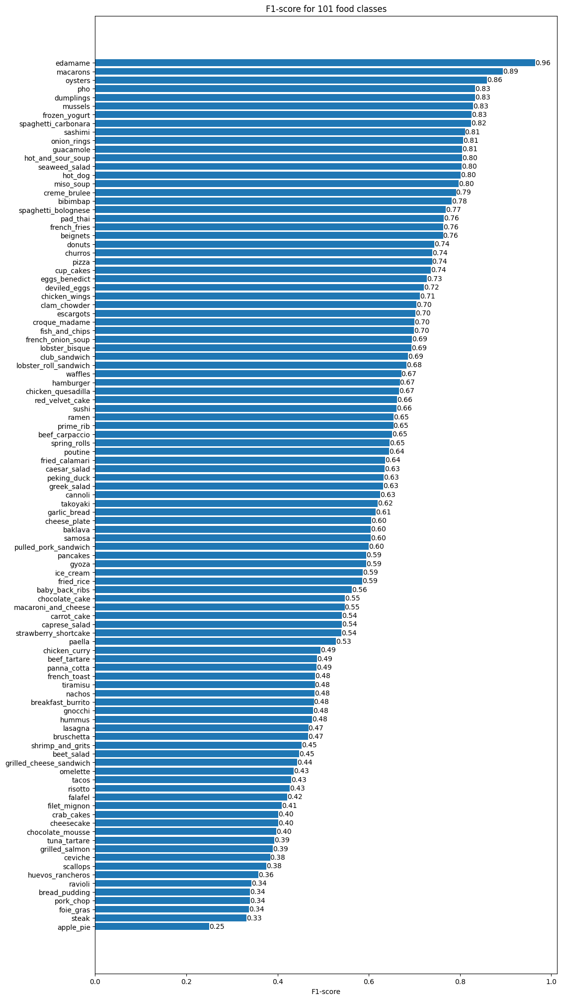

In [47]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1-score for 101 food classes")
ax.bar_label(scores, fmt="%.2f")
ax.invert_yaxis();

## Visualizing predictions on test images

Steps:
* Read in a target inmage filepath using tf.io.read_file()
* turn the image into a tensor using tf.io.decode_image()
* Resize the image tensor to be the same size as images our model has trained on using tf.image.resize()
* Scale the image to get all of the pizel values between 0 & 1

In [48]:
# Create a function to load and prepare images
def load_and_prep_image(filename, img_size=224, scale=True):
    """
    reads in an image form filename, turns it into a tensor and reshapes into specified shape
    
    Args:
        filename (str): path to target image
        img_shape (int): height/width dimentions of target image size
        scale (bool): scale pixel values from 0-255 to  0-1 or not
        
    Returns:
        Image tensor of shape (img_shape, img_shape, 3)
    """
    # Read in the image
    img = tf.io.read_file(filename=filename)
    
    # Decode image into tensor
    img = tf.io.decode_image(img, channels=3)
    
    # Resize the image
    img = tf.image.resize(img, [img_size, img_size])
    
    # Scaling
    if scale:
        # Rescale the image
        return img/255.
    else:
        return img

1/1 [==============================] - 0s 23ms/step


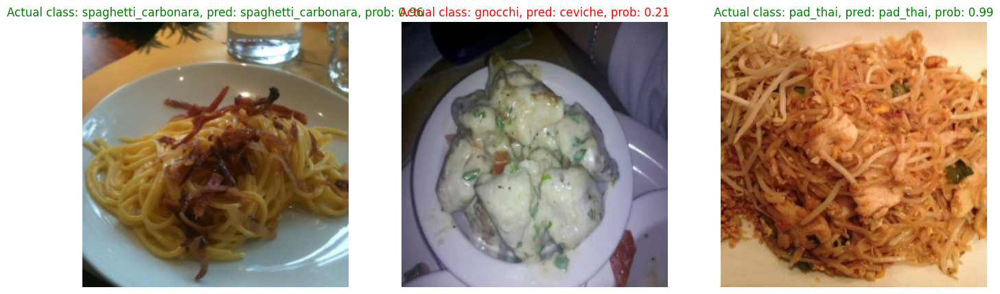

In [49]:
# visualize test images

# Make preds on series of random images
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
    # Choose a random image from random class
    class_name = random.choice(class_names)
    filename = random.choice(os.listdir(test_dir + "/" + class_name))
    filepath = test_dir + "/" + class_name + "/" + filename
    
    # Load the images and make predictions
    img = load_and_prep_image(filepath, scale=False)
    img_expanded = tf.expand_dims(img, axis=0)
    # pred_prob = model.predict(img_expanded) # get perdiction probability array
    pred_prob = loaded_model.predict(img_expanded) # get perdiction probability array
    pred_class = class_names[pred_prob.argmax()] # get highest prediction probability index
    
    # Plot the images
    plt.subplot(1, 3, i+1)
    plt.imshow(img/255)
    if class_name == pred_class: # if predicted class matches, truth class, make text green
        title_color = "g"
    else:
        title_color = "r"
    plt.title(f"Actual class: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
    plt.axis(False);
    

## Finding the most wrong predictions

In [50]:
# get all of the files from test_data
filepaths = []
for filepath in test_data.list_files("101_food_classes_10_percent/test/*/*.jpg", shuffle=False):
    filepaths.append(filepath.numpy())
    
filepaths[:10]

[b'101_food_classes_10_percent/test/apple_pie/1011328.jpg',
 b'101_food_classes_10_percent/test/apple_pie/101251.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1034399.jpg',
 b'101_food_classes_10_percent/test/apple_pie/103801.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1038694.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1047447.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1068632.jpg',
 b'101_food_classes_10_percent/test/apple_pie/110043.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1106961.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1113017.jpg']

In [51]:
# Create a dataframe of different parameters
pred_df = pd.DataFrame({"img_path": filepaths,
                       "y_true": y_label,
                       "y_pred": pred_classes,
                       "pred_conf": preds_probs.max(axis=1), # Get the maximum prediction probability value
                       "y_true_classname": [class_names[i] for i in y_label],
                       "y_pred_classname": [class_names[i] for i in pred_classes]})
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.464129,apple_pie,apple_pie
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.951077,apple_pie,apple_pie
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.509953,apple_pie,apple_pie
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.229368,apple_pie,bread_pudding
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.608671,apple_pie,bread_pudding
...,...,...,...,...,...,...
25245,b'101_food_classes_10_percent/test/waffles/942...,100,100,0.884503,waffles,waffles
25246,b'101_food_classes_10_percent/test/waffles/954...,100,16,0.775514,waffles,cheese_plate
25247,b'101_food_classes_10_percent/test/waffles/961...,100,100,0.397226,waffles,waffles
25248,b'101_food_classes_10_percent/test/waffles/970...,100,94,0.308786,waffles,strawberry_shortcake


In [52]:
# Find which predictions are wrong
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.464129,apple_pie,apple_pie,True
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.951077,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.509953,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.229368,apple_pie,bread_pudding,False
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.608671,apple_pie,bread_pudding,False


In [53]:
# Sort dataframe to have most wrong predictions at top
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
11642,b'101_food_classes_10_percent/test/garlic_brea...,46,10,0.998236,garlic_bread,bruschetta,False
23797,b'101_food_classes_10_percent/test/sushi/16593...,95,86,0.997170,sushi,sashimi,False
9110,b'101_food_classes_10_percent/test/falafel/241...,36,31,0.996112,falafel,donuts,False
12487,b'101_food_classes_10_percent/test/grilled_che...,49,25,0.996088,grilled_cheese_sandwich,club_sandwich,False
24479,b'101_food_classes_10_percent/test/takoyaki/68...,97,78,0.995945,takoyaki,poutine,False
23631,b'101_food_classes_10_percent/test/strawberry_...,94,83,0.995658,strawberry_shortcake,red_velvet_cake,False
191,b'101_food_classes_10_percent/test/apple_pie/3...,0,31,0.995612,apple_pie,donuts,False
14482,b'101_food_classes_10_percent/test/hummus/8476...,57,51,0.995422,hummus,guacamole,False
18001,b'101_food_classes_10_percent/test/pancakes/10...,72,67,0.995116,pancakes,omelette,False
10346,b'101_food_classes_10_percent/test/french_onio...,41,54,0.994481,french_onion_soup,hot_and_sour_soup,False


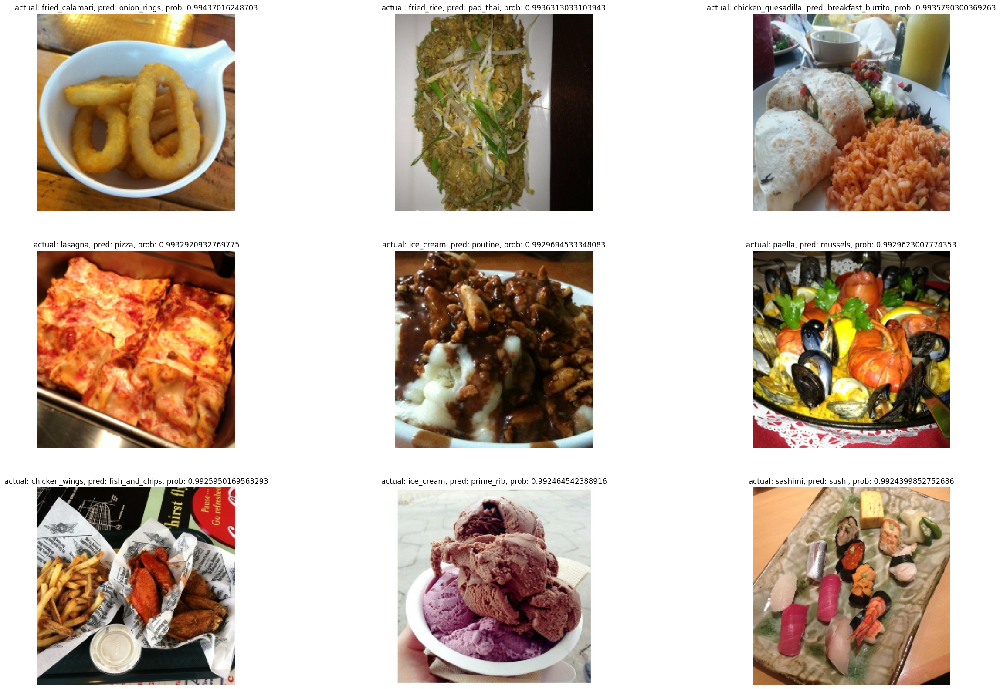

In [54]:
# Visualize wrong predictions
images_to_view = 9
start_index = 10
plt.figure(figsize=(30, 20))
for i, row in enumerate(top_100_wrong[start_index:start_index + images_to_view].itertuples()):
    plt.subplot(3, 3, i+1)
    img = load_and_prep_image(row[1], scale=False)
    _, _, _, _, pred_prob, y_true_classname, y_pred_classname, _ = row # skipping few values
    plt.imshow(img/255)
    plt.title(f"actual: {y_true_classname}, pred: {y_pred_classname}, prob: {pred_prob}")
    plt.axis(False);
    

## Test model on custom images

In [55]:
!python -m wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

/bin/bash: /home/priteshk/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)
100% [....................................................] 13192985 / 13192985
Saved under custom_food_images.zip


In [56]:
unzip_data("custom_food_images.zip")
walk_through_dir("custom_food_images")

There are 0 directories and 6 images in 'custom_food_images'.


In [57]:
# Get custom food images filepaths
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 [==============================] - 0s 23ms/step


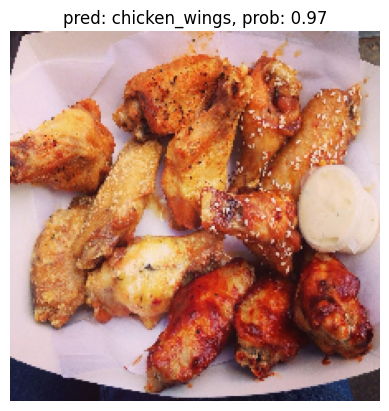

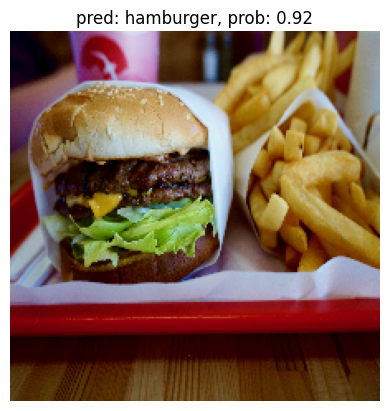

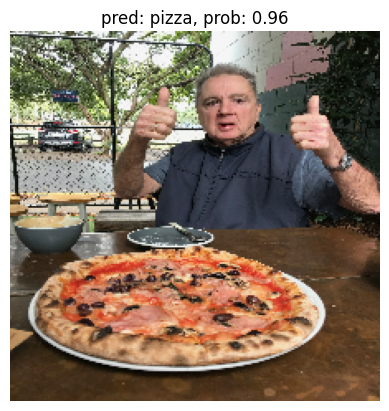

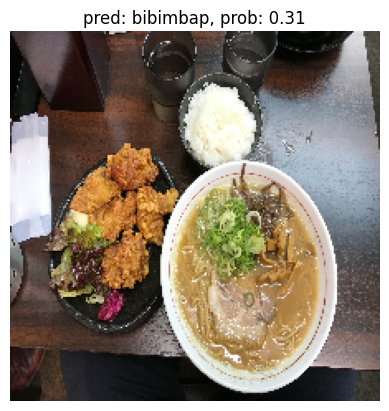

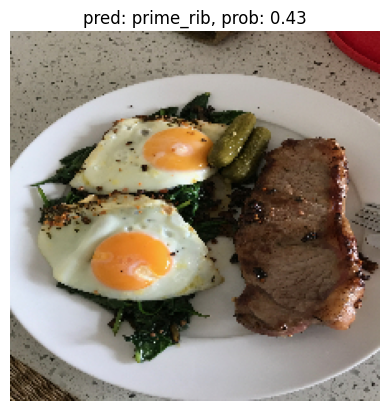

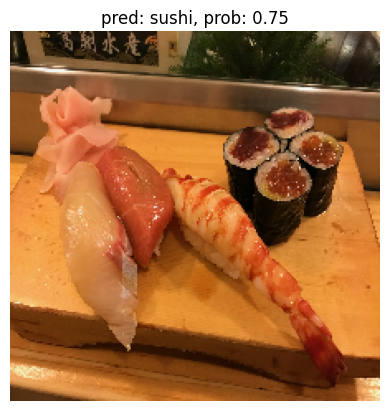

In [58]:
# make predictions and plot custom food images
for img in custom_food_images:
    img = load_and_prep_image(img, scale=False)
    pred_prob = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_prob.argmax()]
    
    # Plot the information
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
    plt.axis(False);